In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from scipy.stats import linregress

In [2]:
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True, 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-ERA-20C/MARgrid_EUf.nc')
lon = ds.LON[jmin:jmax,imin:imax]
lat = ds.LAT[jmin:jmax,imin:imax]
H = np.array(ds.SH[jmin:jmax,imin:imax])

#### Alps masks

In [3]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False


In [4]:
ne_alps = np.copy(alps) # ne : north-east
ne_alps[lat<46.7] = False


nw_alps2 = np.copy(alps) # nw : north-west
nw_alps2[lon>7.9] = False
nw_alps2[lat<45.9] = False
nw_alps2[lat>46.7] = False

nw_alps3 = np.copy(alps) # nw : north-west
nw_alps3[lon>6.9] = False
nw_alps3[lat<44.8] = False
nw_alps3[lat>46.7] = False

nw_alps4 = np.copy(alps) # nw : north-west
nw_alps4[lon>8.3] = False
nw_alps4[lat<46.4] = False
nw_alps4[lat>46.7] = False

nw_alps5 = np.copy(alps) # nw : north-west
nw_alps5[lon>7.1] = False
nw_alps5[lat<45.2] = False
nw_alps5[lat>46.7] = False

nw_alps = np.logical_or(np.logical_or(np.logical_or(nw_alps2,nw_alps3),nw_alps4),nw_alps5)


s_alps = np.logical_and(alps,np.invert(np.logical_or(nw_alps,ne_alps)))

#### Scatter plots for trends as a function of altitude

In [5]:
def get_slopes(wp_meanseason):

    wp_meanseason_hist = wp_meanseason[:54,:,:,:]
    wp_meanseason_fut = wp_meanseason[55:,:,:,:]
    
    origin_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    slope_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    pvalue_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    
    origin_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    slope_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    pvalue_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    
    for i in range(wp_meanseason.shape[3]):
        # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
        for j in range(wp_meanseason.shape[2]):
            for season in range(4):
                linregress_hist = linregress(np.arange(wp_meanseason_hist.shape[0]), wp_meanseason_hist[:,season,j,i])
                origin_hist[season][j][i] = linregress_hist.intercept
                slope_hist[season][j][i] = linregress_hist.slope
                pvalue_hist[season][j][i] = linregress_hist.pvalue
                
                linregress_fut = linregress(np.arange(wp_meanseason_fut.shape[0]), wp_meanseason_fut[:,season,j,i])
                origin_fut[season][j][i] = linregress_fut.intercept
                slope_fut[season][j][i] = linregress_fut.slope
                pvalue_fut[season][j][i] = linregress_fut.pvalue

    return slope_hist, slope_fut

In [6]:
def get_slopes_and_pvalue(wp_meanseason):

    wp_meanseason_hist = wp_meanseason[:54,:,:,:]
    wp_meanseason_fut = wp_meanseason[55:,:,:,:]
    
    origin_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    slope_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    pvalue_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    
    origin_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    slope_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    pvalue_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    
    for i in range(wp_meanseason.shape[3]):
        # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
        for j in range(wp_meanseason.shape[2]):
            for season in range(4):
                linregress_hist = linregress(np.arange(wp_meanseason_hist.shape[0]), wp_meanseason_hist[:,season,j,i])
                origin_hist[season][j][i] = linregress_hist.intercept
                slope_hist[season][j][i] = linregress_hist.slope
                pvalue_hist[season][j][i] = linregress_hist.pvalue
                
                linregress_fut = linregress(np.arange(wp_meanseason_fut.shape[0]), wp_meanseason_fut[:,season,j,i])
                origin_fut[season][j][i] = linregress_fut.intercept
                slope_fut[season][j][i] = linregress_fut.slope
                pvalue_fut[season][j][i] = linregress_fut.pvalue

    return slope_hist, slope_fut, pvalue_hist, pvalue_fut

In [7]:
def get_slopes_and_origin(wp_meanseason):

    wp_meanseason_hist = wp_meanseason[:54,:,:,:]
    wp_meanseason_fut = wp_meanseason[55:,:,:,:]
    
    origin_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    slope_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    pvalue_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    
    origin_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    slope_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    pvalue_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    
    for i in range(wp_meanseason.shape[3]):
        # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
        for j in range(wp_meanseason.shape[2]):
            for season in range(4):
                linregress_hist = linregress(np.arange(wp_meanseason_hist.shape[0]), wp_meanseason_hist[:,season,j,i])
                origin_hist[season][j][i] = linregress_hist.intercept
                slope_hist[season][j][i] = linregress_hist.slope
                pvalue_hist[season][j][i] = linregress_hist.pvalue
                
                linregress_fut = linregress(np.arange(wp_meanseason_fut.shape[0]), wp_meanseason_fut[:,season,j,i])
                origin_fut[season][j][i] = linregress_fut.intercept
                slope_fut[season][j][i] = linregress_fut.slope
                pvalue_fut[season][j][i] = linregress_fut.pvalue

    return slope_hist, slope_fut, origin_hist, origin_fut

In [8]:
def plot_4reg_4seas(Slope_hist,Slope_245,Slope_585,Xlim,Suptitle,Xlabel):
    f, axs = pplt.subplots(ncols=4, nrows=4)
    leg = ['1961-2014','2015-2100 (SSP585)','2015-2100 (SSP245)']

    # Hist
    for i in range(4):
        slope_hist_alps = np.ma.masked_array(Slope_hist[i], mask=np.invert(alps))
        slope_hist_ne_alps = np.ma.masked_array(Slope_hist[i], mask=np.invert(ne_alps))
        slope_hist_nw_alps = np.ma.masked_array(Slope_hist[i], mask=np.invert(nw_alps))
        slope_hist_s_alps = np.ma.masked_array(Slope_hist[i], mask=np.invert(s_alps))
        slopes=[slope_hist_alps,slope_hist_ne_alps,slope_hist_nw_alps,slope_hist_s_alps]
        
        for j,slope in enumerate(slopes):
            ax = axs[i+4*j]
            hist_dots = ax.scatter(10*slope.flatten(),H.flatten(),s=2,label=leg[0])

    # SSP585
    for i in range(4):
        slope_fut_alps = np.ma.masked_array(Slope_585[i], mask=np.invert(alps))
        slope_fut_ne_alps = np.ma.masked_array(Slope_585[i], mask=np.invert(ne_alps))
        slope_fut_nw_alps = np.ma.masked_array(Slope_585[i], mask=np.invert(nw_alps))
        slope_fut_s_alps = np.ma.masked_array(Slope_585[i], mask=np.invert(s_alps))
        slopes=[slope_fut_alps,slope_fut_ne_alps,slope_fut_nw_alps,slope_fut_s_alps]
        
        for j,slope in enumerate(slopes):
            ax = axs[i+4*j]
            ssp585_dots = ax.scatter(10*slope.flatten(),H.flatten(),s=2,label=leg[1])

    # SSP245
    for i in range(4):
        slope_fut_alps = np.ma.masked_array(Slope_245[i], mask=np.invert(alps))
        slope_fut_ne_alps = np.ma.masked_array(Slope_245[i], mask=np.invert(ne_alps))
        slope_fut_nw_alps = np.ma.masked_array(Slope_245[i], mask=np.invert(nw_alps))
        slope_fut_s_alps = np.ma.masked_array(Slope_245[i], mask=np.invert(s_alps))
        slopes=[slope_fut_alps,slope_fut_ne_alps,slope_fut_nw_alps,slope_fut_s_alps]
        
        for j,slope in enumerate(slopes):
            ax = axs[i+4*j]
            ssp245_dots = ax.scatter(10*slope.flatten(),H.flatten(),s=2,label=leg[2])
            ax.set_xlim(Xlim)
            ax.set_ylim((0.,3500))
            #if(j==3):
            #    ax.legend([blue_dot,orange_dot],leg,loc='bottom')
    
    axs.format(suptitle=Suptitle,collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['Alps','NE Alps','NW Alps','Southern Alps'],xlabel=Xlabel,ylabel='Elevation (m.a.s.l.)')
    f.legend([hist_dots,ssp245_dots,ssp585_dots],loc='bottom')

In [9]:
wp_meanseason_meanT_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanT_585 = np.copy(wp_meanseason_meanT_245)
fp_meanseason_meanT_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanT_585[54:,:,:,:] = fp_meanseason_meanT_585

In [10]:
slope_T_hist,slope_T_245,origin_T_hist,origin_T_245 = get_slopes_and_origin(wp_meanseason_meanT_245)

slope_T_hist,slope_T_585,origin_T_hist,origin_T_585 = get_slopes_and_origin(wp_meanseason_meanT_585)

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to ins

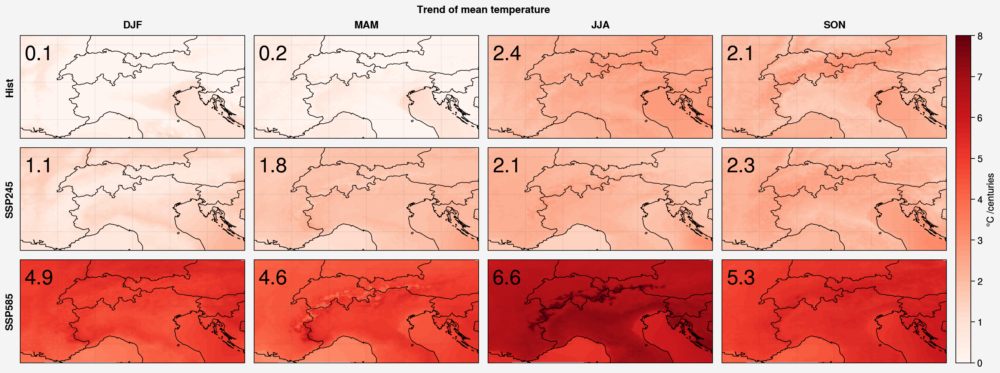

In [11]:
f, axs = pplt.subplots(proj='cyl',ncols=4,nrows=3,axwidth=3)

for i in range(4):
    ax = axs[i]
    cb = ax.pcolormesh(lon,lat,100*slope_T_hist[i],levels=np.linspace(0,8,65),cmap='Reds')
    ax.text(5,47.5,"{:.1f}".format(np.mean(100*slope_T_hist[i])),ha='center',va='center',fontsize=20)
    
    ax = axs[i+4]
    cb = ax.pcolormesh(lon,lat,100*slope_T_245[i],levels=np.linspace(0,8,65),cmap='Reds')
    ax.text(5,47.5,"{:.1f}".format(np.mean(100*slope_T_245[i])),ha='center',va='center',fontsize=20)
    
    ax = axs[i+8]
    cb = ax.pcolormesh(lon,lat,100*slope_T_585[i],levels=np.linspace(0,8,65),cmap='Reds')
    ax.text(5,47.5,"{:.1f}".format(np.mean(100*slope_T_585[i])),ha='center',va='center',fontsize=20)

f.colorbar(cb, label= '°C /centuries',ticks=np.linspace(0,8,9))

axs.format(**multiplot_format,suptitle='Trend of mean temperature',collabels=['DJF','MAM','JJA', 'SON'],rowlabels=['Hist','SSP245','SSP585'])

0.0007347521342495726
0.011113714398850807
0.04929889974431782
0.0021694297598501473
0.018490529886763835
0.04645107200176965
0.023931487054184054
0.02058779698387539
0.06639343280001332
0.021305111133654953
0.02269635411670073
0.053128135338239464


Text(0, 0.5, 'T (°C)')

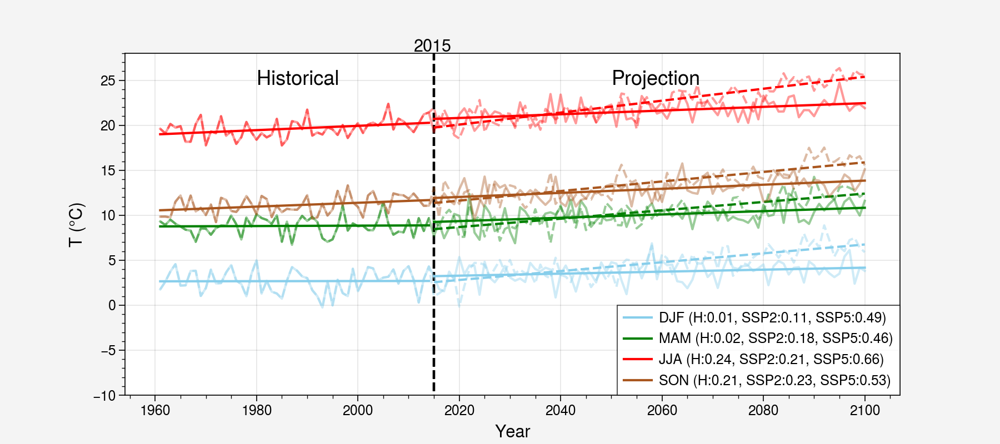

In [12]:
time = np.arange(1961,2101)

seas_names = ['DJF (H:0.01, SSP2:0.11, SSP5:0.49)','MAM (H:0.02, SSP2:0.18, SSP5:0.46)','JJA (H:0.24, SSP2:0.21, SSP5:0.66)','SON (H:0.21, SSP2:0.23, SSP5:0.53)']
season_col = ['skyblue','green','r','sienna']

wp_meanseason_meanT_245_meanarea = wp_meanseason_meanT_245.mean(axis=(2,3))
wp_meanseason_meanT_585_meanarea = wp_meanseason_meanT_585.mean(axis=(2,3))

f,ax=plt.subplots(figsize=(9, 4))

for season in range(4):
    ax.plot(time,wp_meanseason_meanT_245_meanarea[:,season],color=season_col[season],alpha=0.4)
    ax.plot(time,wp_meanseason_meanT_585_meanarea[:,season],color=season_col[season],alpha=0.4,linestyle='--')
    ax.vlines(2015,-15,30,'k','--')
    ax.set_ylim([-10,28])

    origin_T_hist_seas = origin_T_hist[season]
    origin_T_245_seas = origin_T_245[season]
    origin_T_585_seas = origin_T_585[season]
    slope_T_hist_seas = slope_T_hist[season]
    slope_T_245_seas = slope_T_245[season]
    slope_T_585_seas = slope_T_585[season]
    plt.plot(time[0:54],origin_T_hist_seas.mean() + slope_T_hist_seas.mean()*np.arange(0,54),color=season_col[season])
    plt.plot(time[54:],origin_T_245_seas.mean() + slope_T_245_seas.mean()*np.arange(0,86),color=season_col[season],label=seas_names[season])
    plt.plot(time[54:],origin_T_585_seas.mean() + slope_T_585_seas.mean()*np.arange(0,86),color=season_col[season],linestyle='--')

    print(slope_T_hist_seas.mean())
    print(slope_T_245_seas.mean())
    print(slope_T_585_seas.mean())
    
    if season==2:
        plt.text(1980, 24.5, 'Historical', fontsize=13)
        plt.text(2050, 24.5, 'Projection', fontsize=13)
        plt.text(2011,28.2,'2015',fontsize=11)

ax.legend(loc='lower right')
ax.set_xlabel('Year',fontsize=11)
ax.set_ylabel('T (°C)',fontsize=11)

In [13]:
slope_T_hist.shape

(4, 91, 139)

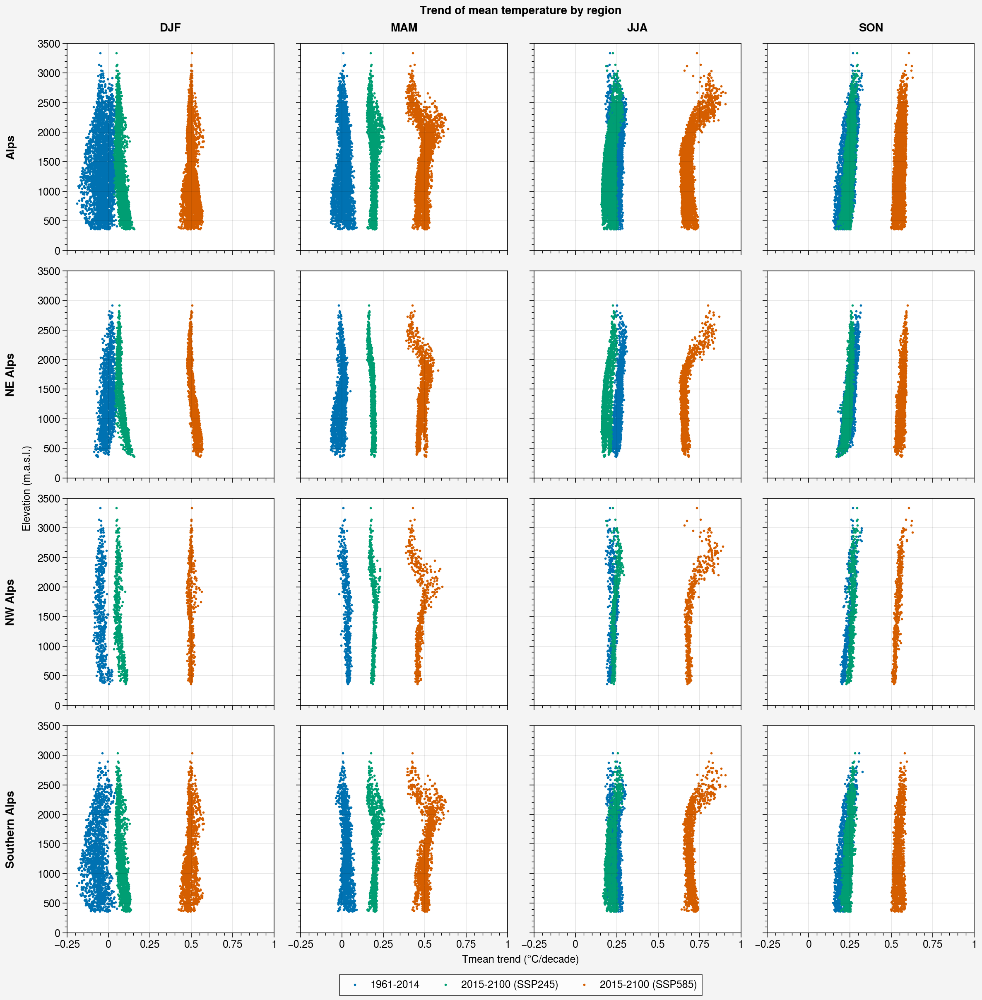

In [14]:
plot_4reg_4seas(slope_T_hist,slope_T_245,slope_T_585,Xlim=(-0.25,1),Suptitle='Trend of mean temperature by region',Xlabel='Tmean trend (°C/decade)')

### Net Shortwave radiation trend

In [15]:
wp_meanseason_meanSWU_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanSWU.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSWU_585 = np.copy(wp_meanseason_meanSWU_245)
fp_meanseason_meanSWU_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanSWU.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSWU_585[54:,:,:,:] = fp_meanseason_meanSWU_585

wp_meanseason_meanSWD_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanSWD.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSWD_585 = np.copy(wp_meanseason_meanSWD_245)
fp_meanseason_meanSWD_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanSWD.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSWD_585[54:,:,:,:] = fp_meanseason_meanSWD_585

wp_meanseason_meanNSW_245 = wp_meanseason_meanSWD_245 - wp_meanseason_meanSWU_245
wp_meanseason_meanNSW_585 = wp_meanseason_meanSWD_585 - wp_meanseason_meanSWU_585

In [16]:
slope_NSW_hist,slope_NSW_245 = get_slopes(wp_meanseason_meanNSW_245)

slope_NSW_hist,slope_NSW_585 = get_slopes(wp_meanseason_meanNSW_585)

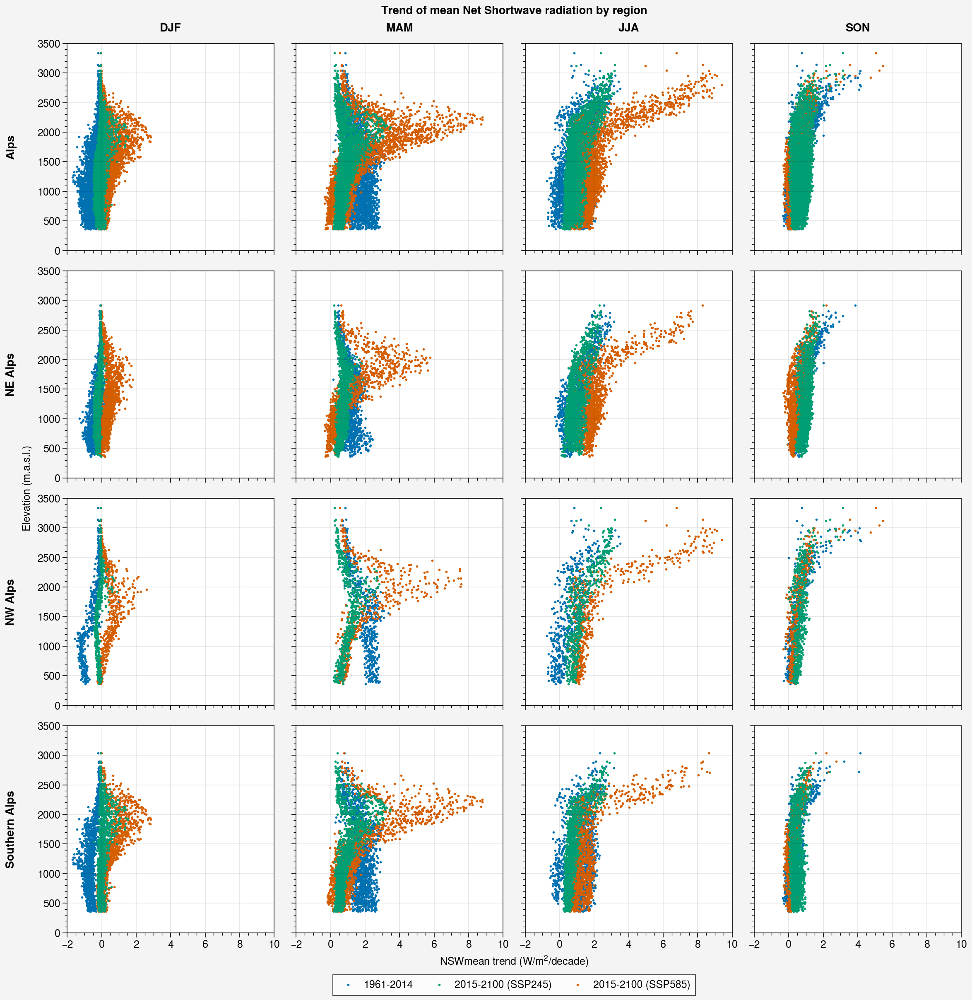

In [17]:
plot_4reg_4seas(slope_NSW_hist,slope_NSW_245,slope_NSW_585,Xlim=(-2.,10.),Suptitle='Trend of mean Net Shortwave radiation by region',
                Xlabel='NSWmean trend (W/$m^2$/decade)')

### Tmin and Tmax

In [18]:
wp_meanseason_minT_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_minT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_minT_585 = np.copy(wp_meanseason_minT_245)
fp_meanseason_minT_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_minT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_minT_585[54:,:,:,:] = fp_meanseason_minT_585

wp_meanseason_maxT_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_maxT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_maxT_585 = np.copy(wp_meanseason_maxT_245)
fp_meanseason_maxT_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_maxT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_maxT_585[54:,:,:,:] = fp_meanseason_maxT_585

In [19]:
slope_minT_hist,slope_minT_245 = get_slopes(wp_meanseason_minT_245)
slope_minT_hist,slope_minT_585 = get_slopes(wp_meanseason_minT_585)

slope_maxT_hist,slope_maxT_245 = get_slopes(wp_meanseason_maxT_245)
slope_maxT_hist,slope_maxT_585 = get_slopes(wp_meanseason_maxT_585)

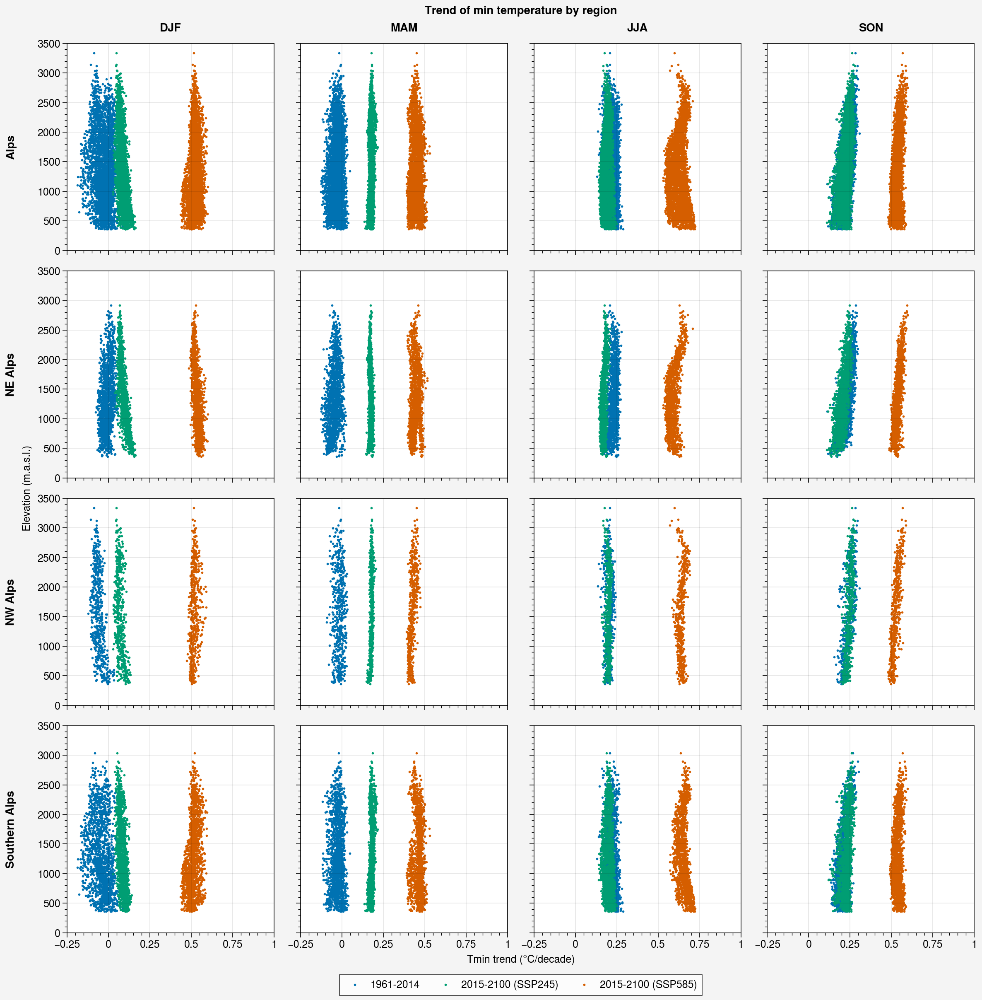

In [20]:
plot_4reg_4seas(slope_minT_hist,slope_minT_245,slope_minT_585,Xlim=(-0.25,1.),Suptitle='Trend of min temperature by region',Xlabel='Tmin trend (°C/decade)')

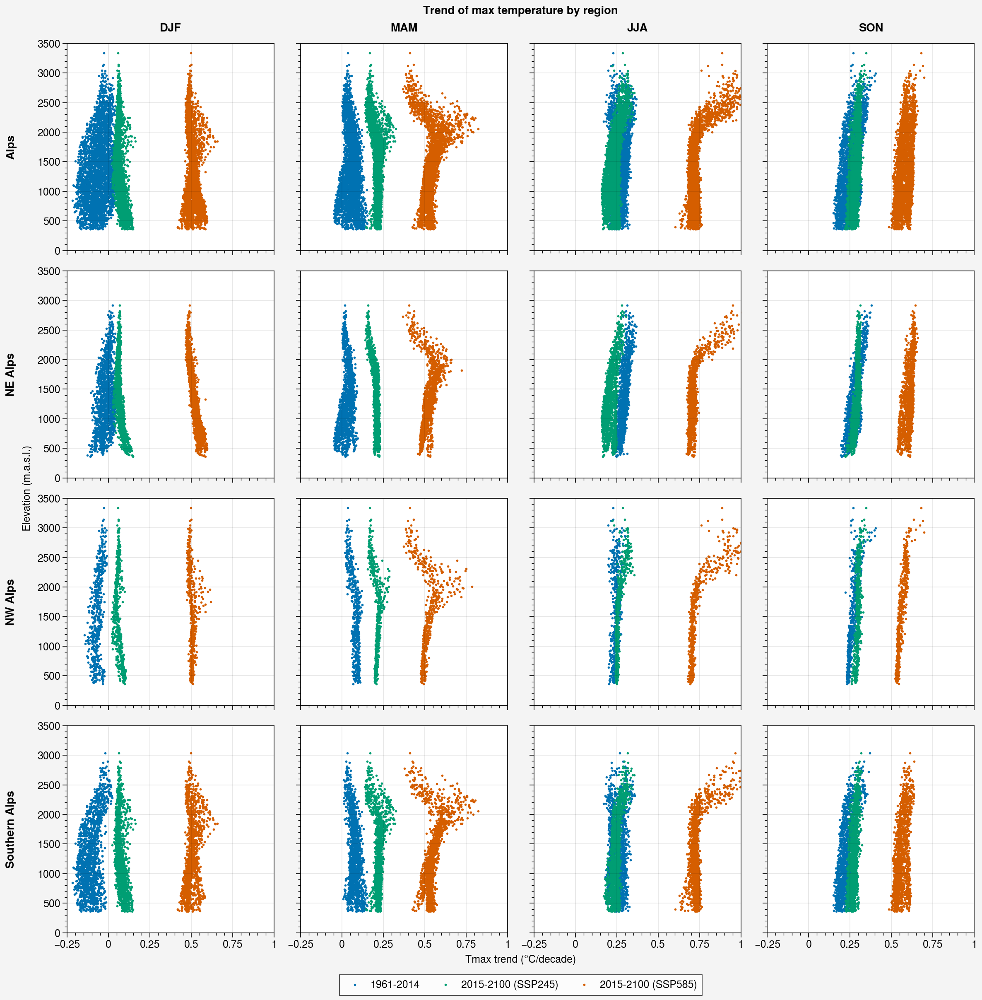

In [21]:
plot_4reg_4seas(slope_maxT_hist,slope_maxT_245,slope_maxT_585,Xlim=(-0.25,1.),Suptitle='Trend of max temperature by region',Xlabel='Tmax trend (°C/decade)')

#### Albedo

In [22]:
wp_meanseason_AL_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_AL.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_AL_585 = np.copy(wp_meanseason_AL_245)
fp_meanseason_AL_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_AL.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_AL_585[54:,:,:,:] = fp_meanseason_AL_585

In [23]:
slope_AL_hist,slope_AL_245 = get_slopes(wp_meanseason_AL_245)
slope_AL_hist,slope_AL_585 = get_slopes(wp_meanseason_AL_585)

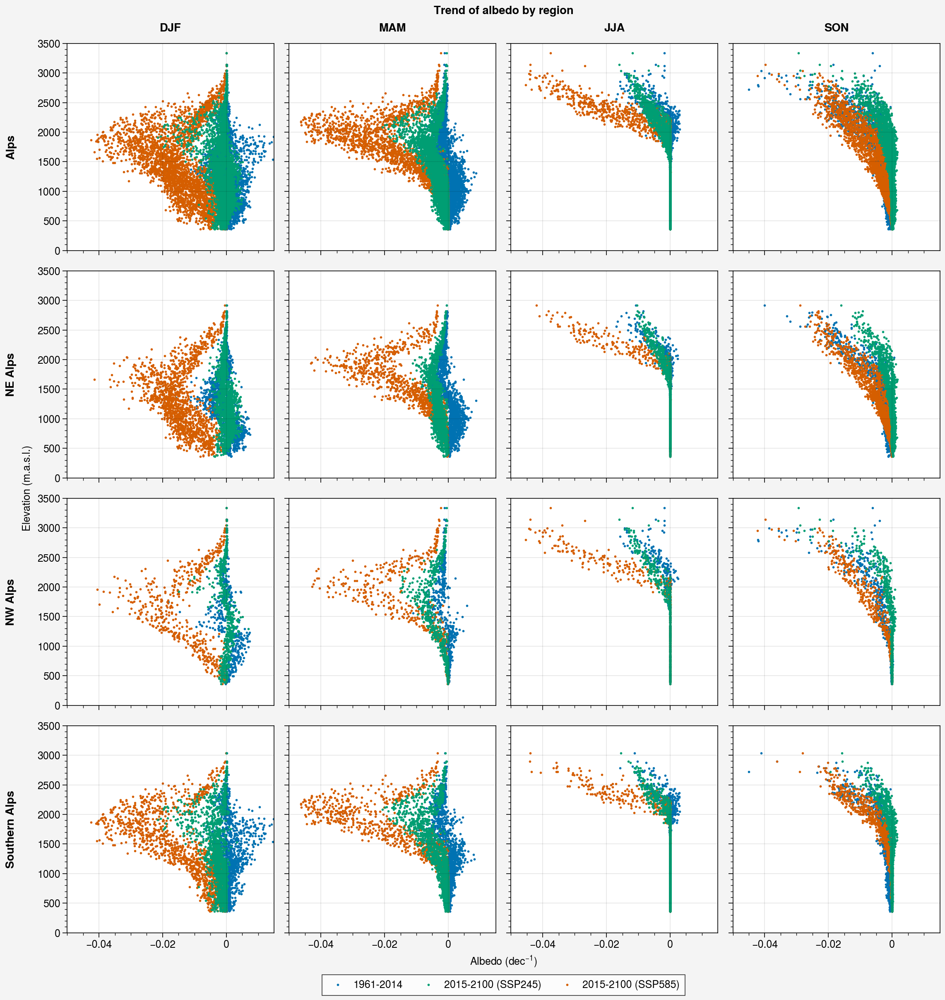

In [24]:
plot_4reg_4seas(slope_AL_hist,slope_AL_245,slope_AL_585,Xlim=(-0.05,0.015),Suptitle='Trend of albedo by region',Xlabel='Albedo ($dec^{-1}$)')

#### Long Wave Down et Net

In [25]:
wp_meanseason_meanLWD_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanLWD.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanLWD_585 = np.copy(wp_meanseason_meanLWD_245)
fp_meanseason_meanLWD_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanLWD.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanLWD_585[54:,:,:,:] = fp_meanseason_meanLWD_585

In [26]:
slope_meanLWD_hist,slope_meanLWD_245 = get_slopes(wp_meanseason_meanLWD_245)
slope_meanLWD_hist,slope_meanLWD_585 = get_slopes(wp_meanseason_meanLWD_585)

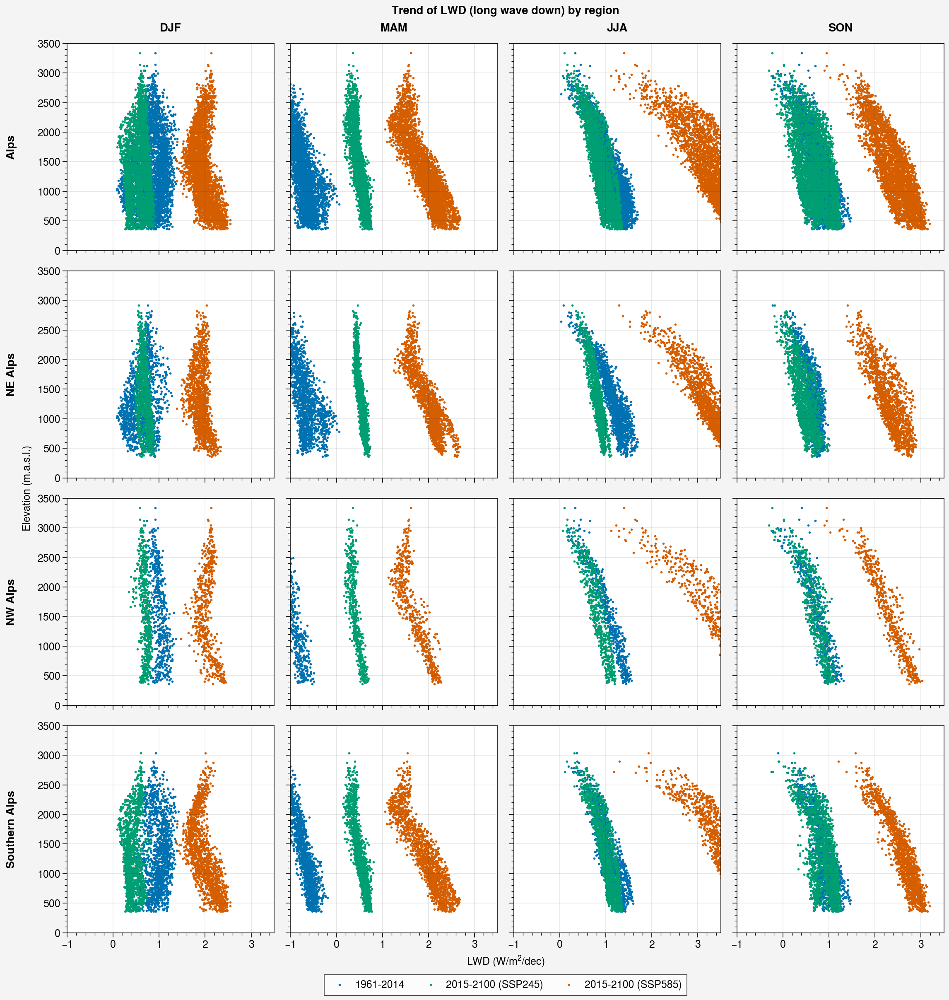

In [27]:
plot_4reg_4seas(slope_meanLWD_hist,slope_meanLWD_245,slope_meanLWD_585,Xlim=(-1.,3.5),Suptitle='Trend of LWD (long wave down) by region',Xlabel='LWD (W/$m^2$/dec)')

In [28]:
wp_meanseason_meanLWU_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanLWU.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanLWU_585 = np.copy(wp_meanseason_meanLWU_245)
fp_meanseason_meanLWU_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanLWU.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanLWU_585[54:,:,:,:] = fp_meanseason_meanLWU_585

In [29]:
wp_meanseason_meanNLW_245 = wp_meanseason_meanLWD_245 - wp_meanseason_meanLWU_245
wp_meanseason_meanNLW_585 = wp_meanseason_meanLWD_585 - wp_meanseason_meanLWU_585

slope_meanNLW_hist,slope_meanNLW_245 = get_slopes(wp_meanseason_meanNLW_245)
slope_meanNLW_hist,slope_meanNLW_585 = get_slopes(wp_meanseason_meanNLW_585)

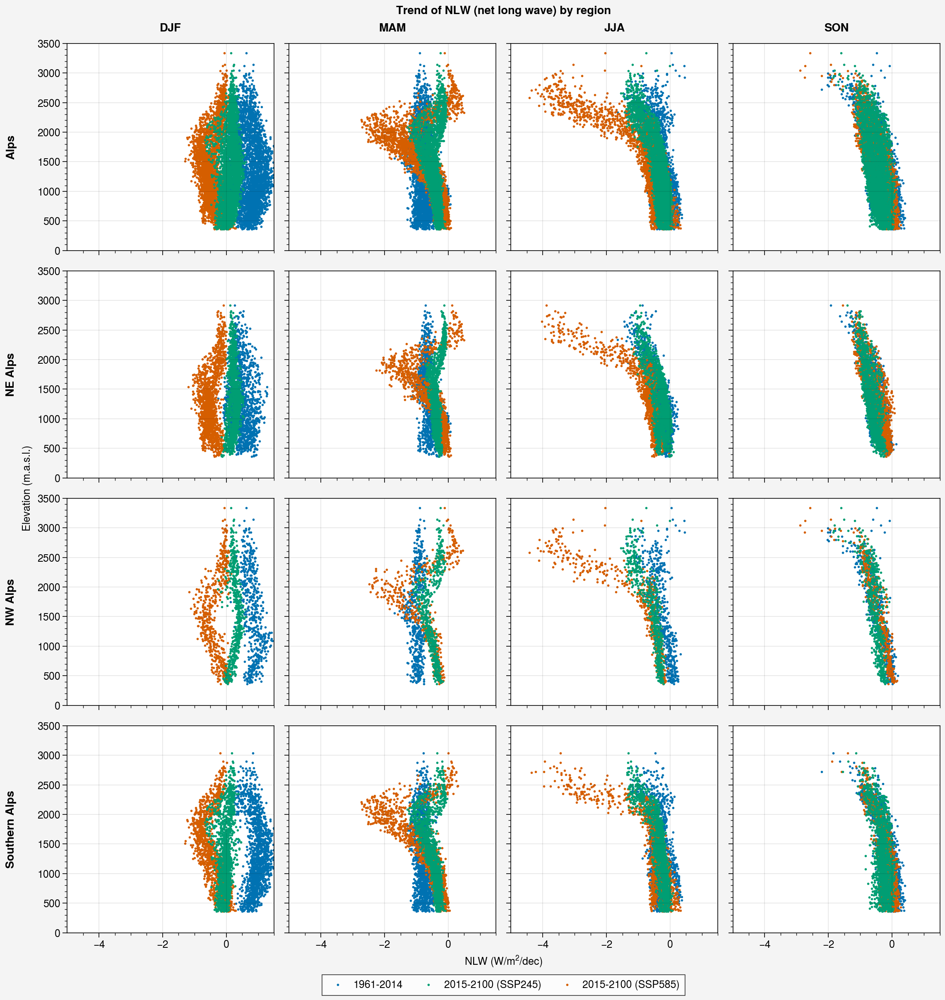

In [30]:
plot_4reg_4seas(slope_meanNLW_hist,slope_meanNLW_245,slope_meanNLW_585,Xlim=(-5.,1.5),Suptitle='Trend of NLW (net long wave) by region',Xlabel='NLW (W/$m^2$/dec)')

#### Latent and Sensible heat flux (LHF and SHF)

In [31]:
wp_meanseason_LHF_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_LHF.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_LHF_585 = np.copy(wp_meanseason_LHF_245)
fp_meanseason_LHF_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_LHF.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_LHF_585[54:,:,:,:] = fp_meanseason_LHF_585

In [32]:
slope_LHF_hist,slope_LHF_245 = get_slopes(wp_meanseason_LHF_245)
slope_LHF_hist,slope_LHF_585 = get_slopes(wp_meanseason_LHF_585)

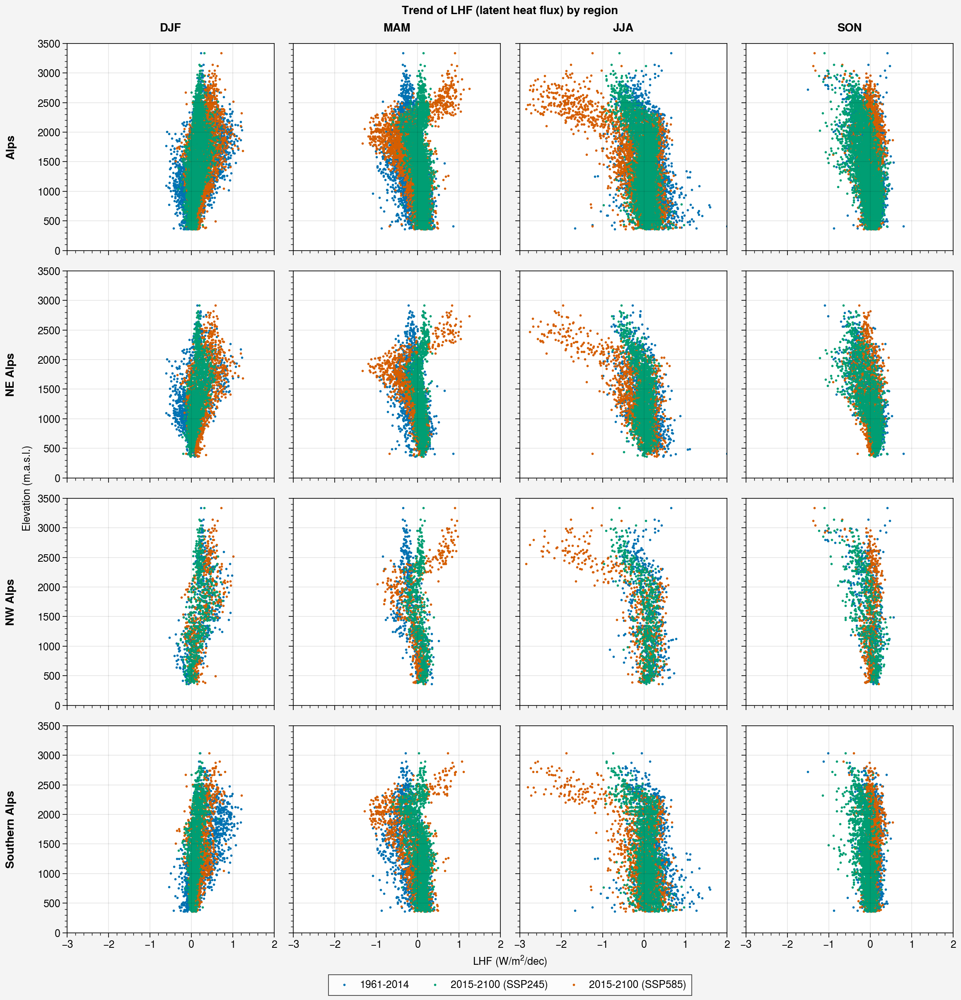

In [33]:
plot_4reg_4seas(slope_LHF_hist,slope_LHF_245,slope_LHF_585,Xlim=(-3.,2),Suptitle='Trend of LHF (latent heat flux) by region',Xlabel='LHF (W/$m^2$/dec)')

In [34]:
wp_meanseason_SHF_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_SHF.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_SHF_585 = np.copy(wp_meanseason_SHF_245)
fp_meanseason_SHF_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_SHF.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_SHF_585[54:,:,:,:] = fp_meanseason_SHF_585

In [35]:
slope_SHF_hist,slope_SHF_245 = get_slopes(wp_meanseason_SHF_245)
slope_SHF_hist,slope_SHF_585 = get_slopes(wp_meanseason_SHF_585)

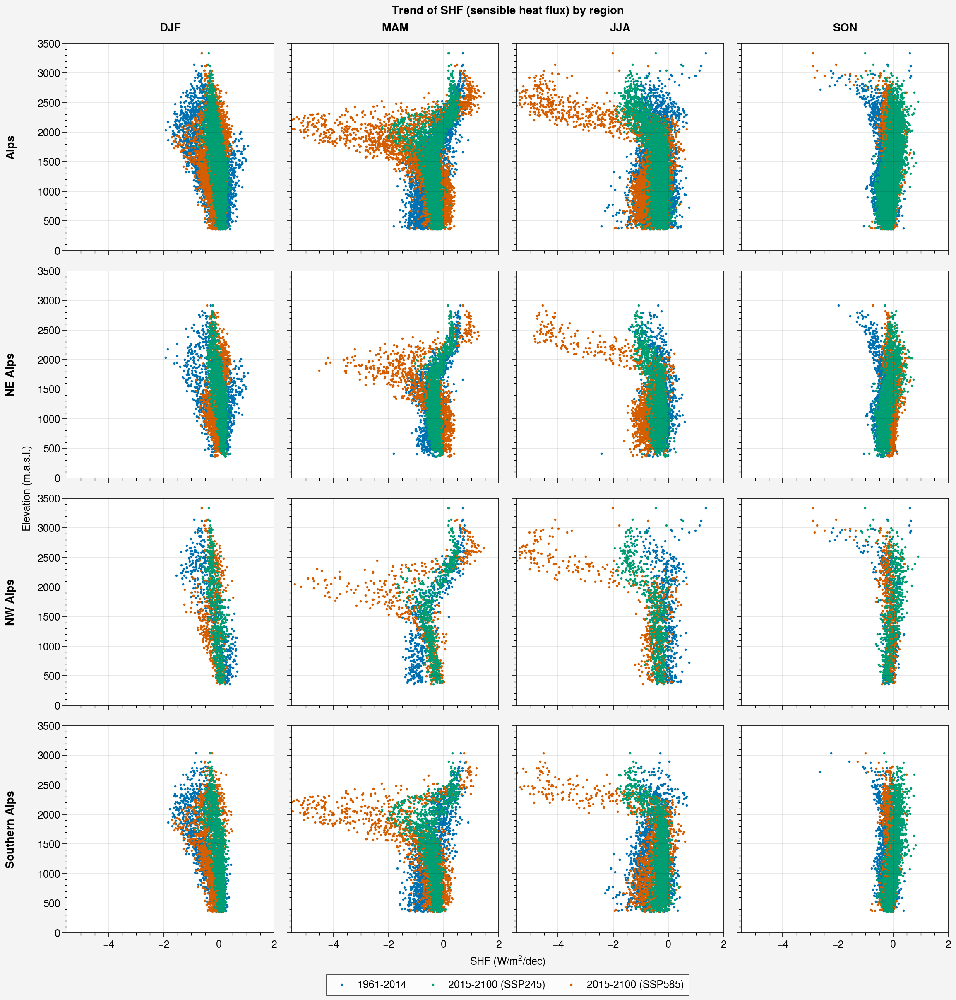

In [36]:
plot_4reg_4seas(slope_SHF_hist,slope_SHF_245,slope_SHF_585,Xlim=(-5.5,2),Suptitle='Trend of SHF (sensible heat flux) by region',Xlabel='SHF (W/$m^2$/dec)')

#### Snow melt energy

In [37]:
wp_meanseason_meltflux_245_orig = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meltenergy.npy')[:,:,jmin:jmax,imin:imax] # it's in W/m² even 
                                                                                                                                        #though it says melt energy
wp_meanseason_meltflux_245 = -wp_meanseason_meltflux_245_orig

wp_meanseason_meltflux_585 = np.copy(wp_meanseason_meltflux_245)
fp_meanseason_meltflux_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meltenergy.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meltflux_585[54:,:,:,:] = -fp_meanseason_meltflux_585

In [53]:
slope_meltflux_hist,slope_meltflux_245 = get_slopes(wp_meanseason_meltflux_245)
slope_meltflux_hist,slope_meltflux_585 = get_slopes(wp_meanseason_meltflux_585)

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/numpy/lib/function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


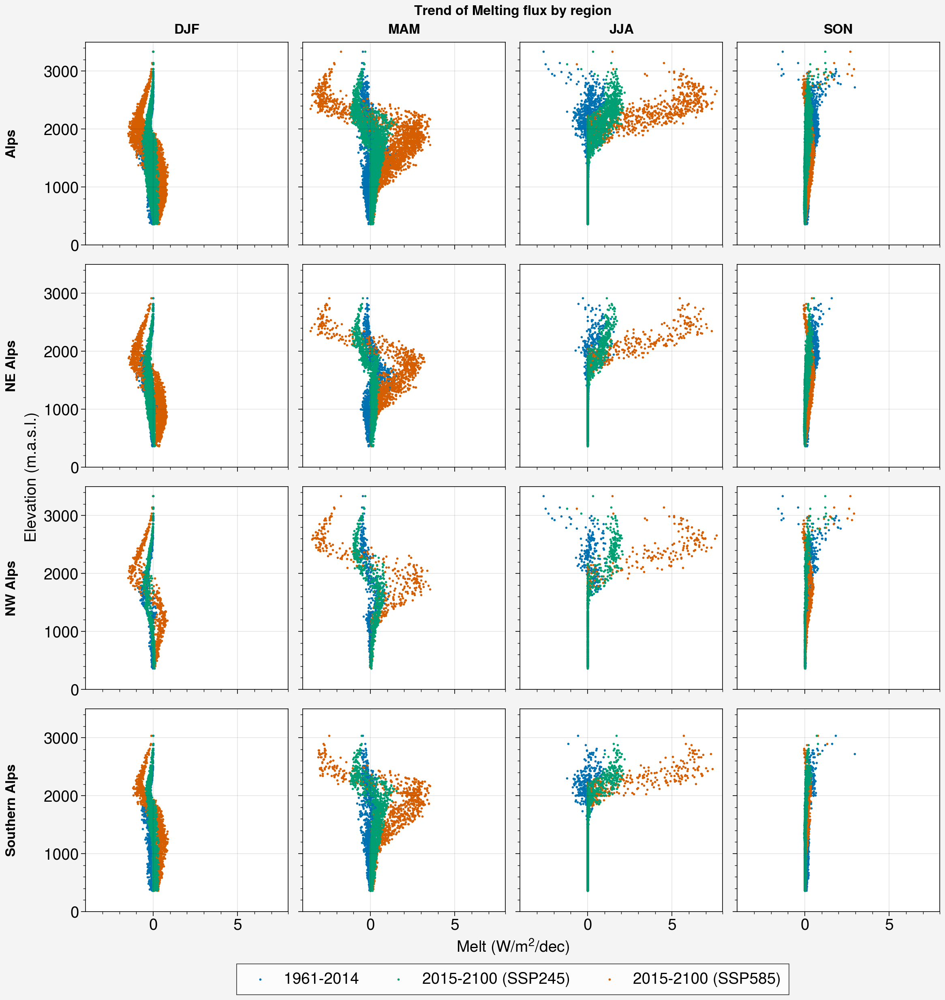

In [54]:
plot_4reg_4seas(slope_meltflux_hist,slope_meltflux_245,slope_meltflux_585,Xlim=(-4,8.),Suptitle='Trend of Melting flux by region',Xlabel='Melt (W/$m^2$/dec)')

#### Energy balance

In [55]:
wp_meanseason_energy_balance_245 = wp_meanseason_SHF_245 + wp_meanseason_LHF_245 + wp_meanseason_meanNLW_245 + wp_meanseason_meanNSW_245 + wp_meanseason_meltflux_245

wp_meanseason_energy_balance_585 = wp_meanseason_SHF_585 + wp_meanseason_LHF_585 + wp_meanseason_meanNLW_585 + wp_meanseason_meanNSW_585 + wp_meanseason_meltflux_585

In [56]:
slope_energy_balance_hist,slope_energy_balance_245 = get_slopes(wp_meanseason_energy_balance_245)

slope_energy_balance_hist,slope_energy_balance_585 = get_slopes(wp_meanseason_energy_balance_585)

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/numpy/lib/function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


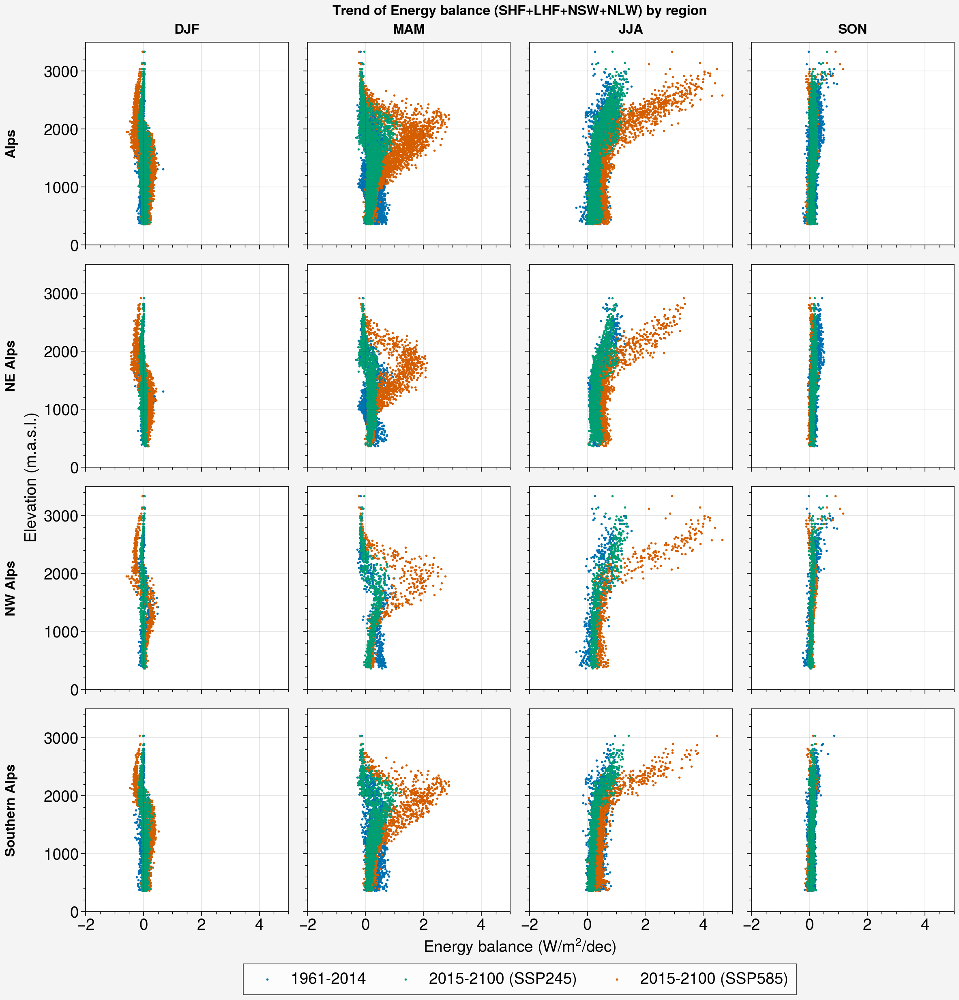

In [57]:
plot_4reg_4seas(slope_energy_balance_hist,slope_energy_balance_245,slope_energy_balance_585,Xlim=(-2.,5),
                Suptitle='Trend of Energy balance (SHF+LHF+NSW+NLW) by region',Xlabel='Energy balance (W/$m^2$/dec)')

#### Surface temperature

In [58]:
wp_meanseason_ST_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_ST.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_ST_585 = np.copy(wp_meanseason_ST_245)
fp_meanseason_ST_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_ST.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_ST_585[54:,:,:,:] = fp_meanseason_ST_585

In [59]:
slope_ST_hist,slope_ST_245 = get_slopes(wp_meanseason_ST_245)
slope_ST_hist,slope_ST_585 = get_slopes(wp_meanseason_ST_585)

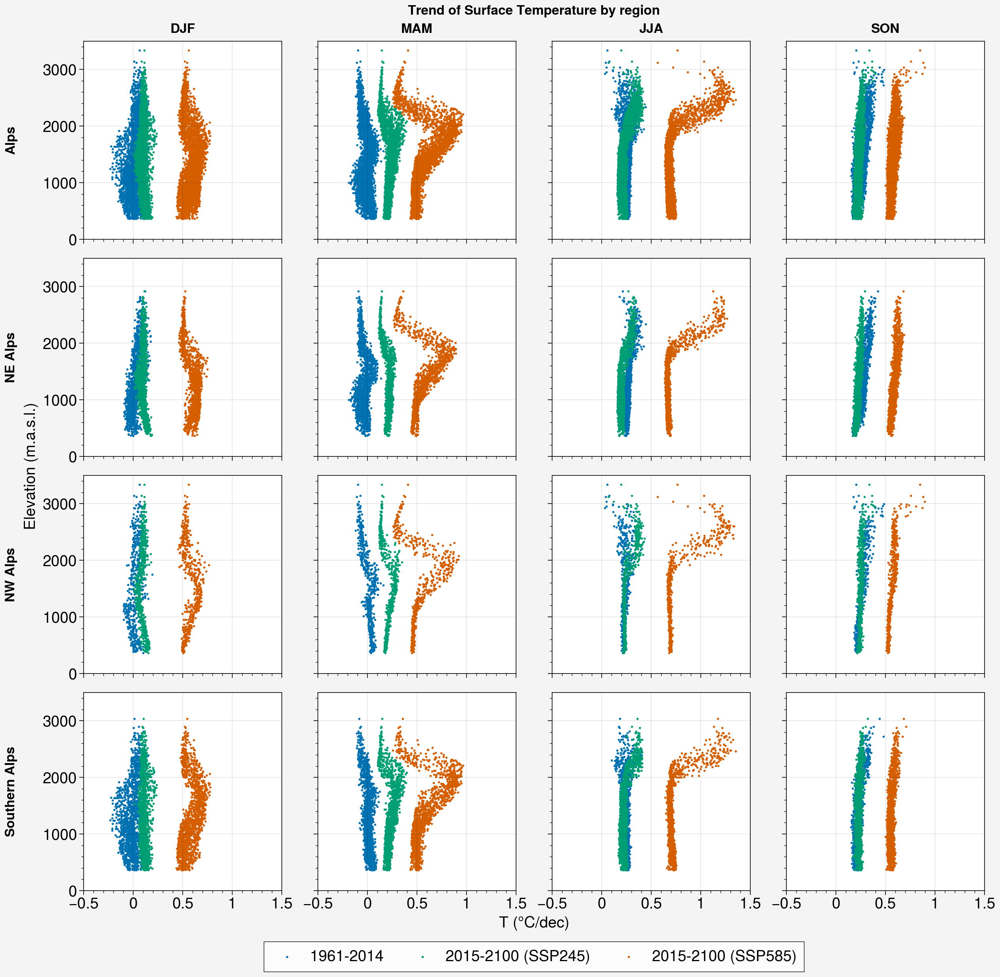

In [60]:
plot_4reg_4seas(slope_ST_hist,slope_ST_245,slope_ST_585,Xlim=(-0.5,1.5),
                Suptitle='Trend of Surface Temperature by region',Xlabel='T (°C/dec)')

### Trends averaged by altitude bands

In [61]:
# Levels (altitude bands)

levels = [np.logical_and(alps,H<400), np.logical_and(alps,np.logical_and(H>=400,H<600)), np.logical_and(alps,np.logical_and(H>=600,H<800)),
          np.logical_and(alps,np.logical_and(H>=800,H<1000)), np.logical_and(alps,np.logical_and(H>=1000,H<1200)), np.logical_and(alps,np.logical_and(H>=1200,H<1400)),
          np.logical_and(alps,np.logical_and(H>=1400,H<1600)), np.logical_and(alps,np.logical_and(H>=1600,H<1800)), np.logical_and(alps,np.logical_and(H>=1800,H<2000)),
          np.logical_and(alps,np.logical_and(H>=2000,H<2200)), np.logical_and(alps,np.logical_and(H>=2200,H<2400)), np.logical_and(alps,np.logical_and(H>=2400,H<2600)),
          np.logical_and(alps,np.logical_and(H>=2600,H<2800)), np.logical_and(alps,np.logical_and(H>=2800,H<3000)),
          np.logical_and(alps,H>=3000)]#,
          #alps]

H_levels = [300,500,700,900,1100,1300,1500,1700,1900,2100,2300,2500,2700,2900,3100]

In [62]:
mean1_snowline_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/daily_snowline_minmaxaverage_alpsregions_mean1pix.npy')
mean10_snowline_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/daily_snowline_minmaxaverage_alpsregions_mean10pix.npy')
mean10_snowline_245.shape

(3, 4, 140, 365)

In [63]:
mean1_snowline_585_orig = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/daily_snowline_minmaxaverage_alpsregions_mean1pix.npy')
mean10_snowline_585_orig = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/daily_snowline_minmaxaverage_alpsregions_mean10pix.npy')
mean10_snowline_585_orig.shape

(3, 4, 86, 365)

In [64]:
mean1_snowline_585 = np.copy(mean1_snowline_245)
mean1_snowline_585[:,:,54:,:] = mean1_snowline_585_orig

mean10_snowline_585 = np.copy(mean10_snowline_245)
mean10_snowline_585[:,:,54:,:] = mean10_snowline_585_orig
mean10_snowline_585.shape

(3, 4, 140, 365)

In [65]:
mean1_minH_snow_seas_245 = np.full((4,140,4),np.nan)
mean1_maxH_nosnow_seas_245 = np.full((4,140,4),np.nan)
mean1_average_minmax_snow_seas_245 = np.full((4,140,4),np.nan)

mean1_snowline_seas_245 = [mean1_minH_snow_seas_245,mean1_maxH_nosnow_seas_245,mean1_average_minmax_snow_seas_245]

mean1_minH_snow_seas_585 = np.full((4,140,4),np.nan)
mean1_maxH_nosnow_seas_585 = np.full((4,140,4),np.nan)
mean1_average_minmax_snow_seas_585 = np.full((4,140,4),np.nan)

mean1_snowline_seas_585 = [mean1_minH_snow_seas_585,mean1_maxH_nosnow_seas_585,mean1_average_minmax_snow_seas_585]

for i in range(4):
    for j in range(3):
        
        mean1_snowline_seas_245[j][i,:,0] = np.median(np.concatenate((mean1_snowline_245[j][i,:,:59],mean1_snowline_245[j][i,:,334:365]),axis=1),axis=1)
        mean1_snowline_seas_245[j][i,:,1] = np.median(mean1_snowline_245[j][i,:,59:151],axis=1)
        mean1_snowline_seas_245[j][i,:,2] = np.median(mean1_snowline_245[j][i,:,151:243],axis=1)
        mean1_snowline_seas_245[j][i,:,3] = np.median(mean1_snowline_245[j][i,:,243:334],axis=1)

        mean1_snowline_seas_585[j][i,:,0] = np.median(np.concatenate((mean1_snowline_585[j][i,:,:59],mean1_snowline_585[j][i,:,334:365]),axis=1),axis=1)
        mean1_snowline_seas_585[j][i,:,1] = np.median(mean1_snowline_585[j][i,:,59:151],axis=1)
        mean1_snowline_seas_585[j][i,:,2] = np.median(mean1_snowline_585[j][i,:,151:243],axis=1)
        mean1_snowline_seas_585[j][i,:,3] = np.median(mean1_snowline_585[j][i,:,243:334],axis=1)

In [66]:
mean10_minH_snow_seas_245 = np.full((4,140,4),np.nan)
mean10_maxH_nosnow_seas_245 = np.full((4,140,4),np.nan)
mean10_average_minmax_snow_seas_245 = np.full((4,140,4),np.nan)

mean10_snowline_seas_245 = [mean10_minH_snow_seas_245,mean10_maxH_nosnow_seas_245,mean10_average_minmax_snow_seas_245]

mean10_minH_snow_seas_585 = np.full((4,140,4),np.nan)
mean10_maxH_nosnow_seas_585 = np.full((4,140,4),np.nan)
mean10_average_minmax_snow_seas_585 = np.full((4,140,4),np.nan)

mean10_snowline_seas_585 = [mean10_minH_snow_seas_585,mean10_maxH_nosnow_seas_585,mean10_average_minmax_snow_seas_585]

for i in range(4):
    for j in range(3):
        
        mean10_snowline_seas_245[j][i,:,0] = np.median(np.concatenate((mean10_snowline_245[j][i,:,:59],mean10_snowline_245[j][i,:,334:365]),axis=1),axis=1)
        mean10_snowline_seas_245[j][i,:,1] = np.median(mean10_snowline_245[j][i,:,59:151],axis=1)
        mean10_snowline_seas_245[j][i,:,2] = np.median(mean10_snowline_245[j][i,:,151:243],axis=1)
        mean10_snowline_seas_245[j][i,:,3] = np.median(mean10_snowline_245[j][i,:,243:334],axis=1)

        mean10_snowline_seas_585[j][i,:,0] = np.median(np.concatenate((mean10_snowline_585[j][i,:,:59],mean10_snowline_585[j][i,:,334:365]),axis=1),axis=1)
        mean10_snowline_seas_585[j][i,:,1] = np.median(mean10_snowline_585[j][i,:,59:151],axis=1)
        mean10_snowline_seas_585[j][i,:,2] = np.median(mean10_snowline_585[j][i,:,151:243],axis=1)
        mean10_snowline_seas_585[j][i,:,3] = np.median(mean10_snowline_585[j][i,:,243:334],axis=1)

/tmp/ipykernel_2094115/1567620458.py:11: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=14, large=12)
/tmp/ipykernel_2094115/1567620458.py:11: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=14, large=12)


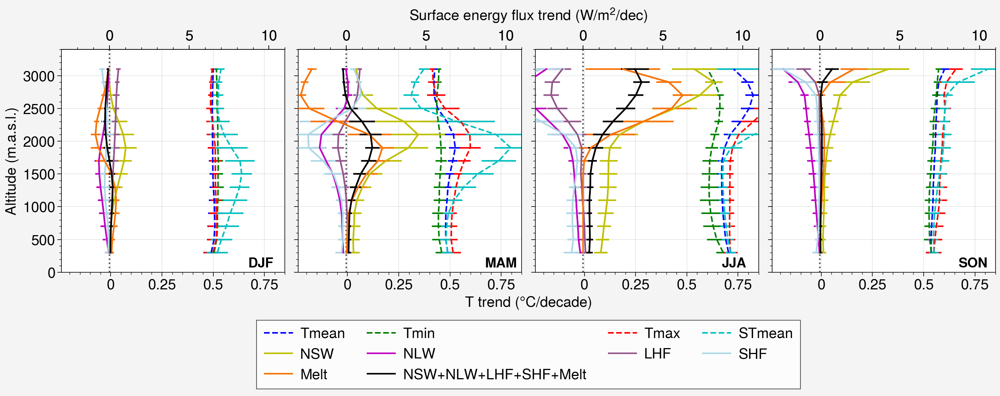

In [67]:
# --- Choose time period/scenario ---

#slopes_var = [slope_T_245,slope_minT_245,slope_maxT_245,slope_ST_245,slope_NSW_245,slope_meanNLW_245,slope_LHF_245,slope_SHF_245,slope_meltflux_245,
#              slope_energy_balance_245]
slopes_var = [slope_T_585,slope_minT_585,slope_maxT_585,slope_ST_585,slope_NSW_585,slope_meanNLW_585,slope_LHF_585,slope_SHF_585,slope_meltflux_585,
              slope_energy_balance_585]
#slopes_var = [slope_T_hist,slope_Tmin_hist,slope_Tmax_hist,slope_ST_hist,slope_NSW_hist,slope_NLW_hist,slope_LHF_hist,slope_SHF_hist,slope_meltflux_hist,
#              slope_energy_balance_hist]

# ------------------------------- Only Trends -----------------------------------------------------------------------------------------
pplt.rc.update(small=14, large=12)

n_levels=len(levels)
n_seas=4
seasons=['DJF','MAM','JJA','SON']
colors = ['b','g','r','c','y','m','purple','lightblue','orange','k']

with pplt.rc.context({'suptitle.weight': 'normal', 'suptitle.size': 14}):
    f, axs = pplt.subplots(ncols=4,axwidth=3)
axs2 = axs.twiny()

mean_slope_T=np.full((n_seas,n_levels),np.nan)
mean_slope_Tmin=np.full((n_seas,n_levels),np.nan)
mean_slope_Tmax=np.full((n_seas,n_levels),np.nan)
mean_slope_ST=np.full((n_seas,n_levels),np.nan)
mean_slope_NSW=np.full((n_seas,n_levels),np.nan)
mean_slope_NLW=np.full((n_seas,n_levels),np.nan)
mean_slope_LHF=np.full((n_seas,n_levels),np.nan)
mean_slope_SHF=np.full((n_seas,n_levels),np.nan)
mean_slope_MBm=np.full((n_seas,n_levels),np.nan)
mean_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
mean_slopes = [mean_slope_T,mean_slope_Tmin,mean_slope_Tmax,mean_slope_ST,mean_slope_NSW,mean_slope_NLW,mean_slope_LHF,mean_slope_SHF,mean_slope_MBm,
               mean_slope_energy_balance]

std_slope_T=np.full((n_seas,n_levels),np.nan)
std_slope_Tmin=np.full((n_seas,n_levels),np.nan)
std_slope_Tmax=np.full((n_seas,n_levels),np.nan)
std_slope_ST=np.full((n_seas,n_levels),np.nan)
std_slope_NSW=np.full((n_seas,n_levels),np.nan)
std_slope_NLW=np.full((n_seas,n_levels),np.nan)
std_slope_LHF=np.full((n_seas,n_levels),np.nan)
std_slope_SHF=np.full((n_seas,n_levels),np.nan)
std_slope_MBm=np.full((n_seas,n_levels),np.nan)
std_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
std_slopes = [std_slope_T,std_slope_Tmin,std_slope_Tmax,std_slope_ST,std_slope_NSW,std_slope_NLW,std_slope_LHF,std_slope_SHF,std_slope_MBm,
              std_slope_energy_balance]



for i in range(n_seas): # seasons
    ax = axs[i]
    ax2 = axs2[i]
    for j in range(n_levels): # levels
        for var in range(len(slopes_var)):
            slope_var = np.ma.masked_array(slopes_var[var][i], mask=np.invert(levels[j])).reshape(12649)
            mean_slopes[var][i,j] = 10*slope_var.mean()
            std_slopes[var][i,j] = 10*slope_var.std()
            if var<4:
                ax.plot([10*slope_var.mean()-10*slope_var.std(),10*slope_var.mean()+10*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])
            else:
                ax2.plot([10*slope_var.mean()-10*slope_var.std(),10*slope_var.mean()+10*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])

    if i<3:
        ax.plot(mean_slope_T[i,:],H_levels,c='b',linestyle='--')
        ax.plot(mean_slope_Tmin[i,:],H_levels,c='g',linestyle='--')
        ax.plot(mean_slope_Tmax[i,:],H_levels,c='r',linestyle='--')
        ax.plot(mean_slope_ST[i,:],H_levels,c='c',linestyle='--')
        #ax.scatter(mean_slope_TTp[i,:],pressure,label='Free atmosphere',s=10)
        
        ax.set_xlim(-0.24,0.85)
        ax.set_ylim(0,3400)
        ax.text(0.67, 75, seasons[i], fontsize=13,fontweight='semibold')
        #ax.hlines(mean1_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
        #ax.hlines(mean1_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
        #ax.hlines(mean1_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
        #ax.hlines(mean10_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
        #ax.hlines(mean10_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
        #ax.hlines(mean10_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
        
        ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
        ax2.plot(mean_slope_NSW[i,:],H_levels,c='y')
        ax2.plot(mean_slope_NLW[i,:],H_levels,c='m')
        ax2.plot(mean_slope_LHF[i,:],H_levels,c='purple')
        ax2.plot(mean_slope_SHF[i,:],H_levels,c='lightblue')
        ax2.plot(mean_slope_MBm[i,:],H_levels,c='orange')
        ax2.plot(mean_slope_energy_balance[i,:],H_levels,c='k')
        #ax2.plot(mean_slope_NSW[i,:]+mean_slope_NLW[i,:]+mean_slope_LHF[i,:]+mean_slope_SHF[i,:],H_levels,c='k',linestyle='--')
        ax2.set_xlim(-3,11)

ax.plot(mean_slope_T[i,:],H_levels,label='Tmean',c='b',linestyle='--')
ax.plot(mean_slope_Tmin[i,:],H_levels,label='Tmin',c='g',linestyle='--')
ax.plot(mean_slope_Tmax[i,:],H_levels,label='Tmax',c='r',linestyle='--')
ax.plot(mean_slope_ST[i,:],H_levels,label='STmean',c='c',linestyle='--')
#ax.scatter(mean_slope_TTp[i,:],pressure,label='Free atmosphere',s=10)

ax.set_xlim(-0.24,0.85)
ax.set_ylim(0,3400)
ax.text(0.67, 75, seasons[i], fontsize=13,fontweight='semibold')
#ax.hlines(mean1_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
#ax.hlines(mean1_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
#ax.hlines(mean1_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
#ax.hlines(mean10_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
#ax.hlines(mean10_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
#ax.hlines(mean10_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')

ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
ax2.plot(mean_slope_NSW[i,:],H_levels,label='NSW',c='y')
ax2.plot(mean_slope_NLW[i,:],H_levels,label='NLW',c='m')
ax2.plot(mean_slope_LHF[i,:],H_levels,label='LHF',c='purple')
ax2.plot(mean_slope_SHF[i,:],H_levels,label='SHF',c='lightblue')
ax2.plot(mean_slope_MBm[i,:],H_levels,label='Melt',c='orange')
ax2.plot(mean_slope_energy_balance[i,:],H_levels,label='NSW+NLW+LHF+SHF+Melt',c='k')
#ax2.plot(mean_slope_NSW[i,:]+mean_slope_NLW[i,:]+mean_slope_LHF[i,:]+mean_slope_SHF[i,:],H_levels,c='k',linestyle='--',label='NSW+NLW+LHF+SHF')

ax2.set_xlim(-3,11)
#f.set_xlabel('test')

f.legend(loc='b',prop = { "size": 14 },ncols=4)
axs.format(xlabel='T trend (°C/decade)',ylabel='Altitude (m.a.s.l.)',suptitle='Surface energy flux trend (W/$m^2$/dec)')